In [122]:
import load_data

ds = load_data.LabeledDataset(root_dir=load_data.TRAINING_DATA_ROOT)



In [124]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F

# https://pytorch.org/vision/stable/auto_examples/plot_repurposing_annotations.html#sphx-glr-auto-examples-plot-repurposing-annotations-py
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        
        

In [125]:
import torchvision

import importlib

index_to_class = load_data.load_inverted_class_index()

def show_with_bboxes(element):
    img, bboxes, class_idxs = element
    classes = [
        index_to_class[class_idx.item()] 
        for class_idx in class_idxs
    ]
    annotated = torchvision.utils.draw_bounding_boxes(img, bboxes, classes, colors='red')
    show(annotated)



In [126]:
class MergedDataset(torch.utils.data.Dataset):
    def __init__(self, datasets):
        self.datasets = datasets
        
    def __len__(self):
        return sum(map(len, self.datasets))
    
    def __getitem__(self, idx):
        for ds in self.datasets:
            print('try ', idx)
            if idx >= len(ds):
                idx -= len(ds)
            else:
                return ds[idx]
            
train_ds = load_data.LabeledDataset(root_dir=load_data.TRAINING_DATA_ROOT)
val_ds = load_data.LabeledDataset(root_dir=load_data.VALIDATION_DATA_ROOT)
            
            
merged = MergedDataset([train_ds, val_ds])



            

In [127]:
import pandas as pd

teacher_ap = pd.read_csv("data/analysis/teacher_AP.csv")
student_ap = pd.read_csv("data/analysis/student_AP.csv")

teacher_ap

,Wall time,Step,Value
0,1.669651e+09,5999,0.000308
1,1.669657e+09,11999,0.000308
2,1.669662e+09,17999,0.000308
3,1.669667e+09,23999,0.000308
4,1.669673e+09,29999,0.000308
...,...,...,...
75,1.670580e+09,413999,40.892864
76,1.670590e+09,419999,40.930660
77,1.670601e+09,425999,40.954857
78,1.670612e+09,431999,40.918674


In [140]:
teacher_ap[(teacher_ap['Step'] > 150000) & (teacher_ap['Step'] < 210000)]

,Wall time,Step,Value
26,1.669986e+09,155999,0.000000
27,1.669992e+09,161999,0.000000
28,1.669997e+09,167999,0.000000
29,1.670002e+09,173999,0.000000
30,1.670034e+09,179999,32.219807
31,1.670043e+09,185999,34.325035
32,1.670052e+09,191999,35.241425
33,1.670061e+09,197999,35.766598
34,1.670069e+09,203999,36.054268
35,1.670078e+09,209999,36.210815


In [141]:
student_ap[(student_ap['Step'] > 150000) & (student_ap['Step'] < 210000)]

,Wall time,Step,Value
26,1.669986e+09,155999,27.695097
27,1.669992e+09,161999,27.993141
28,1.669997e+09,167999,28.450520
29,1.670002e+09,173999,28.427135
30,1.670034e+09,179999,28.622238
31,1.670043e+09,185999,34.731697
32,1.670052e+09,191999,35.176479
33,1.670061e+09,197999,35.454647
34,1.670069e+09,203999,35.541203
35,1.670078e+09,209999,35.726807


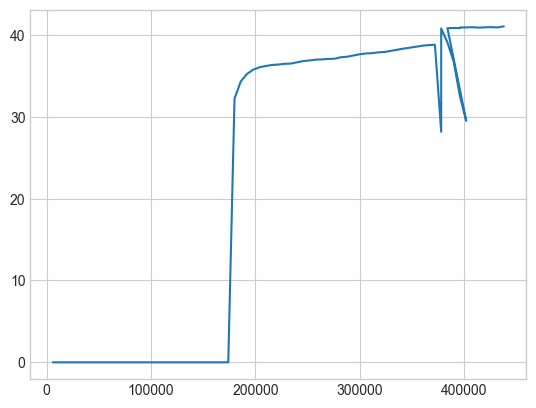

In [128]:
from matplotlib import pyplot as plt

plt.plot(teacher_ap['Step'], teacher_ap['Value'])

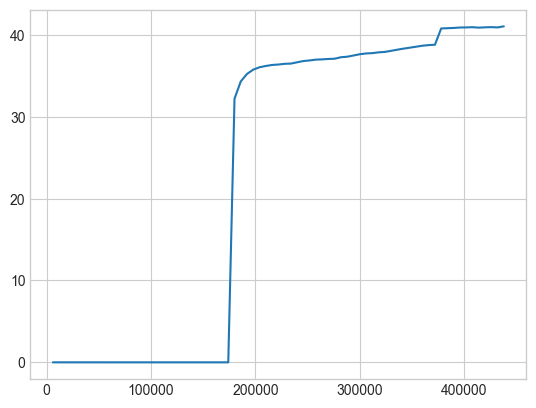

In [129]:
def remove_older_runs(df):
    latest = df.groupby(by='Step', sort=True).agg({
        'Step': 'max',
        'Wall time': 'max',
        'Value': 'idxmax'
    })
    latest['Value'] = df.loc[latest['Value'], 'Value'].values
    return latest

df =  remove_older_runs(teacher_ap)
plt.plot(df['Step'], df['Value'])

In [130]:
teacher_ap_last = remove_older_runs(teacher_ap)
student_ap_last = remove_older_runs(student_ap)


Text(0.5, 0, 'Steps')

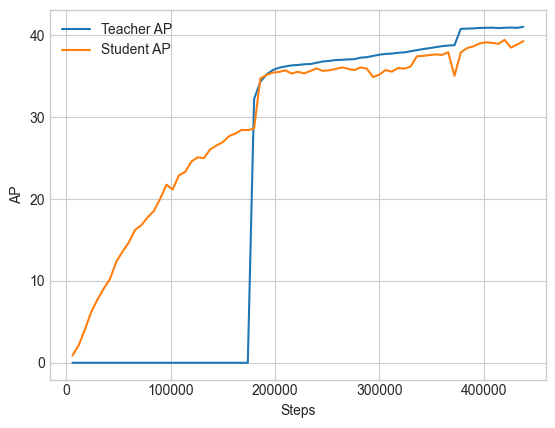

In [134]:
from matplotlib.pyplot import figure

plt.style.use('seaborn-v0_8-whitegrid')

plt.plot(teacher_ap_last['Step'], teacher_ap_last['Value'], label='Teacher AP')
plt.plot(student_ap_last['Step'], student_ap_last['Value'], label='Student AP')

plt.legend(loc='upper left')
#plt.title('AP vs training steps (top-level metric)')
plt.ylabel('AP')
plt.xlabel('Steps')
#plt.grid()

In [31]:

teacher_ap_nail = remove_older_runs(pd.read_csv("data/analysis/nail_ap_teacher.csv"))
student_ap_nail = remove_older_runs(pd.read_csv("data/analysis/nail_ap_student.csv"))

teacher_ap_dog = remove_older_runs(pd.read_csv("data/analysis/dog_ap_teacher.csv"))
student_ap_dog = remove_older_runs(pd.read_csv("data/analysis/dog_ap_student.csv"))


In [33]:
def do_plot(df, label):
    plt.plot(df['Step'], df['Value'], label=label)

In [267]:
from matplotlib.pyplot import figure

figure(figsize=(8, 6), dpi=400)

do_plot(teacher_ap_nail, 'Teacher AP ("nail" class)')
do_plot(student_ap_nail, 'Student AP ("nail" class)')


do_plot(teacher_ap_dog, 'Teacher AP ("dog" class)')
do_plot(student_ap_dog, 'Student AP ("dog" class)')

plt.legend(loc='upper left')
plt.title('AP vs training steps (common vs uncommon classes)')
plt.ylabel('AP')
plt.xlabel('Steps')
plt.grid()

NameError: name 'do_plot' is not defined

<Figure size 3200x2400 with 0 Axes>

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(8, 6), dpi=800)

teacher_ap_filter = teacher_ap_last.tail(10)
student_ap_filter = student_ap_last.tail(10)

do_plot(teacher_ap_filter, 'Teacher AP')
do_plot(student_ap_filter, 'Student AP')

plt.legend(loc='upper left')
plt.title('AP vs training steps (top-level metric, last 60k steps)')
plt.ylabel('AP')
plt.xlabel('Steps')
plt.grid()

In [268]:
from PIL import Image, ImageColor, ImageDraw, ImageFont
import torch 

def _generate_color_palette(num_objects: int):
    palette = torch.tensor([2**25 - 1, 2**15 - 1, 2**21 - 1])
    return [tuple((i * palette) % 255) for i in range(num_objects)]


def draw_bounding_boxes(
    image,
    boxes,
    labels=None,
    colors=None,
    fill=False,
    width = 1,
    font = None,
    font_size = None,
) -> torch.Tensor:

    """
    Draws bounding boxes on given image.
    The values of the input image should be uint8 between 0 and 255.
    If fill is True, Resulting Tensor should be saved as PNG image.

    Args:
        image (Tensor): Tensor of shape (C x H x W) and dtype uint8.
        boxes (Tensor): Tensor of size (N, 4) containing bounding boxes in (xmin, ymin, xmax, ymax) format. Note that
            the boxes are absolute coordinates with respect to the image. In other words: `0 <= xmin < xmax < W` and
            `0 <= ymin < ymax < H`.
        labels (List[str]): List containing the labels of bounding boxes.
        colors (color or list of colors, optional): List containing the colors
            of the boxes or single color for all boxes. The color can be represented as
            PIL strings e.g. "red" or "#FF00FF", or as RGB tuples e.g. ``(240, 10, 157)``.
            By default, random colors are generated for boxes.
        fill (bool): If `True` fills the bounding box with specified color.
        width (int): Width of bounding box.
        font (str): A filename containing a TrueType font. If the file is not found in this filename, the loader may
            also search in other directories, such as the `fonts/` directory on Windows or `/Library/Fonts/`,
            `/System/Library/Fonts/` and `~/Library/Fonts/` on macOS.
        font_size (int): The requested font size in points.

    Returns:
        img (Tensor[C, H, W]): Image Tensor of dtype uint8 with bounding boxes plotted.
    """
    if not isinstance(image, torch.Tensor):
        raise TypeError(f"Tensor expected, got {type(image)}")
    elif image.dtype != torch.uint8:
        raise ValueError(f"Tensor uint8 expected, got {image.dtype}")
    elif image.dim() != 3:
        raise ValueError("Pass individual images, not batches")
    elif image.size(0) not in {1, 3}:
        raise ValueError("Only grayscale and RGB images are supported")
    elif (boxes[:, 0] > boxes[:, 2]).any() or (boxes[:, 1] > boxes[:, 3]).any():
        print('have boxes: ', boxes)
        raise ValueError(
            "Boxes need to be in (xmin, ymin, xmax, ymax) format. Use torchvision.ops.box_convert to convert them"
        )

    num_boxes = boxes.shape[0]

    if num_boxes == 0:
        print("boxes doesn't contain any box. No box was drawn")
        return image

    if labels is None:
        labels = [None] * num_boxes  # type: ignore[no-redef]
    elif len(labels) != num_boxes:
        raise ValueError(
            f"Number of boxes ({num_boxes}) and labels ({len(labels)}) mismatch. Please specify labels for each box."
        )

    if colors is None:
        colors = _generate_color_palette(num_boxes)
    elif isinstance(colors, list):
        if len(colors) < num_boxes:
            raise ValueError(f"Number of colors ({len(colors)}) is less than number of boxes ({num_boxes}). ")
    else:  # colors specifies a single color for all boxes
        colors = [colors] * num_boxes

    colors = [(ImageColor.getrgb(color) if isinstance(color, str) else color) for color in colors]

    if font is None:
        if font_size is not None:
            print("Argument 'font_size' will be ignored since 'font' is not set.")
        txt_font = ImageFont.load_default()
    else:
        txt_font = ImageFont.truetype(font=font, size=font_size or 10)

    # Handle Grayscale images
    if image.size(0) == 1:
        image = torch.tile(image, (3, 1, 1))

    ndarr = image.permute(1, 2, 0).cpu().numpy()
    img_to_draw = Image.fromarray(ndarr)
    img_boxes = boxes.to(torch.int64).tolist()

    if fill:
        draw = ImageDraw.Draw(img_to_draw, "RGBA")
    else:
        draw = ImageDraw.Draw(img_to_draw)
    
    PX_PER_LABEL = 10 if font_size is None else int(font_size) * .9
    for idx, (bbox, color, label) in enumerate(zip(img_boxes, colors, labels)):  # type: ignore[arg-type]
        if fill:
            fill_color = color + (100,)
            draw.rectangle(bbox, width=width, outline=color, fill=fill_color)
        else:
            draw.rectangle(bbox, width=width, outline=color)

        if label is not None:
            margin = width + 1
            draw.text((0, PX_PER_LABEL * idx), label, fill=color, font=txt_font)

        #if label is not None:
        #    margin = width + 1
        #    draw.text((bbox[0] + margin, bbox[1] + margin), label, fill=color, font=txt_font)

    return torch.from_numpy(np.array(img_to_draw)).permute(2, 0, 1).to(dtype=torch.uint8)


In [275]:
import json

results_434k = json.load(open('data/analysis/coco_instances_results_0434999.json', 'r'))
#results_175k = json.load(open('data/analysis/coco_instances_results_174999.json', 'r'))
results_101k = json.load(open('data/analysis/coco_instances_results_0109999.json', 'r'))

In [119]:
import load_data

val_ds = load_data.LabeledDataset(root_dir=load_data.VALIDATION_DATA_ROOT)


In [ ]:
def collect_image_ids(results):
    return {
        result['image_id'] 
        for result in results
    }



In [276]:
imgs_101k = collect_image_ids(results_101k)
print(len(imgs_101k))
imgs_434k = collect_image_ids(results_434k)
print(len(imgs_434k))

imgs_all = imgs_101k & imgs_434k


19997
19997


In [277]:
have_imgs = list(sorted(imgs_all))

In [278]:
cur = 0

In [298]:
#WANT = [27, 38, 53]
WANT = [41, 70, 43, 106, 138, 298]
NAMED = [
    ('101k', results_101k),
   # ('175k', results_175k),
    ('434k', results_434k),
]

In [279]:
index_to_class = load_data.load_inverted_class_index()

def show_with_bboxes(element, color='green'):
    img, bboxes, class_idxs = element
    classes = [
        index_to_class[class_idx.item()] 
        for class_idx in class_idxs
    ]
    annotated = torchvision.utils.draw_bounding_boxes(img, bboxes, classes, colors=color)
    show(annotated)

el:  1


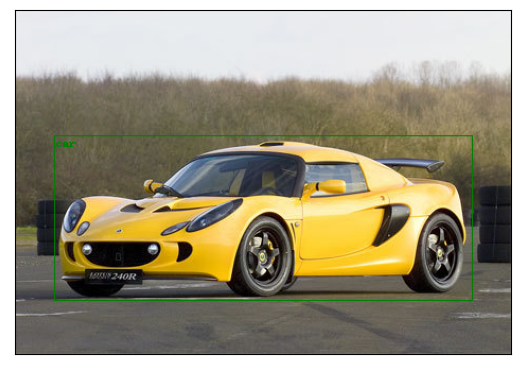

In [126]:
cur += 1
print('el: ', cur)
show_with_bboxes(val_ds[have_imgs[cur]])

In [287]:
print(dir(plt.cm))

['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'ColormapRegistry', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'Mapping', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'ScalarMappable', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', '_LUTSIZE', '__builtins__', '__cached__', '__doc__', '__file__', '__getattr__', '__loader__', '__name__', '__package__', '__spec__', '_api', '_auto_norm_from_scale', '_colormaps', '_ensure_cmap', '_gen_

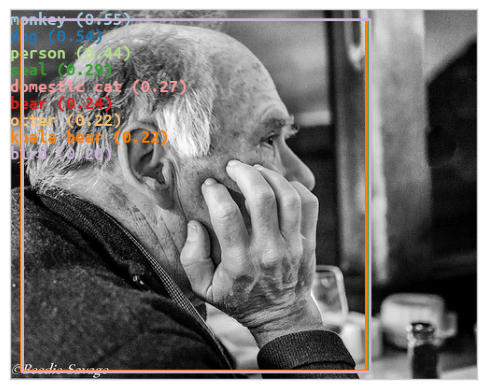

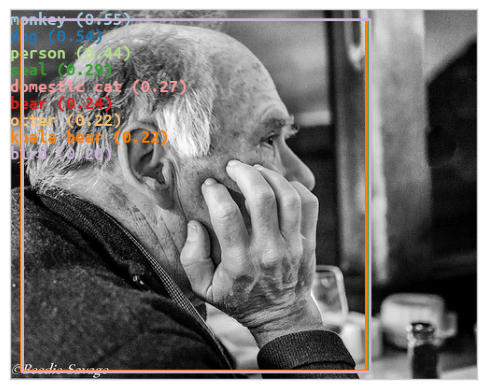

In [307]:
import PIL 
import torchvision 
import random 

import matplotlib.pyplot as plt

#def filter_results_for(idx, results):
#    return [
#        result for result in results
#        if result['image_id'] == idx
#    ]


def filter_results_for(idx, results):
    return [
        result for result in results
        if (result['image_id'] == idx) & (result['score']>0.2)
    ]

random.seed(0)
ALL_COLORS = list(PIL.ImageColor.colormap.keys())
random.shuffle(ALL_COLORS)

#def _generate_color_palette(num_objects: int):
#    palette = torch.tensor([2**25 - 1, 2**15 - 1, 2**21 - 1])
#    return [tuple((i * palette) % 255) for i in range(num_objects)]


def _generate_color_palette(num_objects: int):
    def convert(color):
        return tuple(int(channel * 255) for channel in color[:-1])
    
    return [convert(plt.cm.Paired(i)) for i in range(num_objects)]
    #return [tuple((i * palette) % 255) for i in range(num_objects)]
    #return ALL_COLORS[:num_objects]


def show_with_bboxes_inference(idx, ds, results, color=None, topn=5, font=None, font_size=20, width=3):

    have_results = filter_results_for(idx, results)[:topn]
    if color is None:
        color = _generate_color_palette(len(have_results))
   #     print(color)
    img, _, _ = ds[idx]
    class_idxs = [r['category_id'] for r in have_results]
    bboxes = torchvision.ops.box_convert(torch.tensor([
        r['bbox'] for r in have_results
    ]), in_fmt='xywh', out_fmt='xyxy')
    classes = [
        f'{index_to_class[r["category_id"]]} ({r["score"]:.2f})'
        for r in have_results
    ]
    if font:
        annotated = draw_bounding_boxes(img, bboxes, classes, colors=color, font=font, font_size=font_size, width=width)
    else:
        annotated = draw_bounding_boxes(img, bboxes, classes, colors=color, width=width)
    show(annotated)
    


def show_default(*args, **kwargs):
    show_with_bboxes_inference(*args, **kwargs, color=None, topn=10, font='/usr/share/fonts/truetype/ubuntu/UbuntuMono-B.ttf')
    
show_with_bboxes_inference(2, val_ds, results_434k, color=None, topn=10, font='/usr/share/fonts/truetype/ubuntu/UbuntuMono-B.ttf')
show_default(2, val_ds, results_434k)


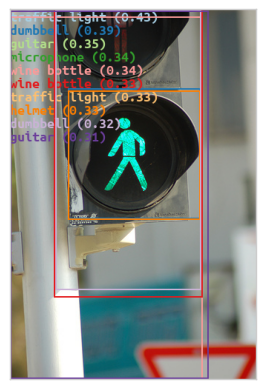

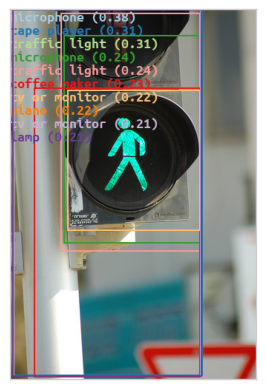

In [293]:
show_default(have_imgs[WANT[0]], val_ds, results_101k)
show_default(have_imgs[WANT[0]], val_ds, results_434k)

In [264]:
cur_idx = 50

In [51]:
GOOD_IMGS = [-1, 17, 23, 35, 40]
cur_idx

3

In [ ]:
microphone

In [311]:
nail_class = load_data.load_class_index()['nail'] 
nail_image_ids = {
    ann['image_id'] 
    for ann in val_annotations['annotations']
    if ann['category_id'] == nail_class 
}

nail_image_ids = list(sorted(nail_image_ids))



In [321]:
mic_class = load_data.load_class_index()['microphone'] 
mic_image_ids = {
    ann['image_id'] 
    for ann in val_annotations['annotations']
    if ann['category_id'] == mic_class 
}

mic_image_ids = list(sorted(mic_image_ids))


In [322]:
cur_idx = 0 

In [339]:
MIC_IDXS = [14,15,18,19, 34]

34
ground truth
inference at  101k
inference at  434k


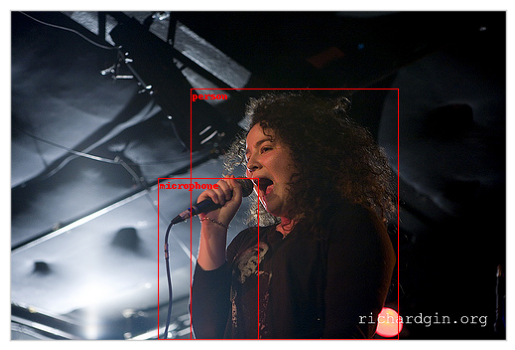

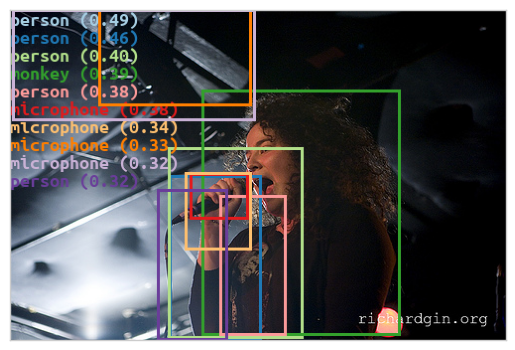

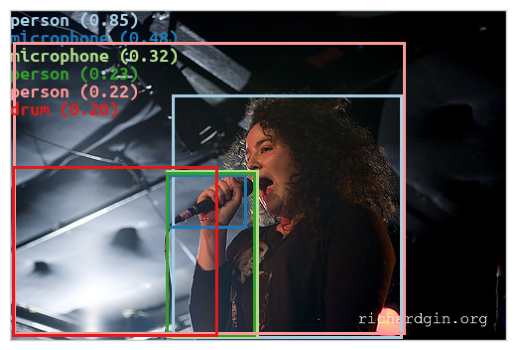

In [358]:
print(cur_idx)
cur_idx += 1
idx = mic_image_ids[cur_idx]
print('ground truth')
show_with_bboxes(val_ds[idx], color='red')
for name, results in NAMED:
    print('inference at ', name)
    try:
        show_default(idx, val_ds, results)
    except Exception as e:
        print('Error: ', e)
        pass
     

ground truth
inference at  101k
inference at  434k
ground truth
inference at  101k
inference at  434k
ground truth
inference at  101k
inference at  434k
ground truth
inference at  101k
inference at  434k
ground truth
inference at  101k
inference at  434k
ground truth
inference at  101k
inference at  434k


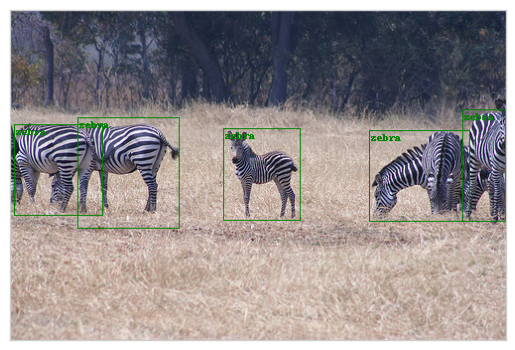

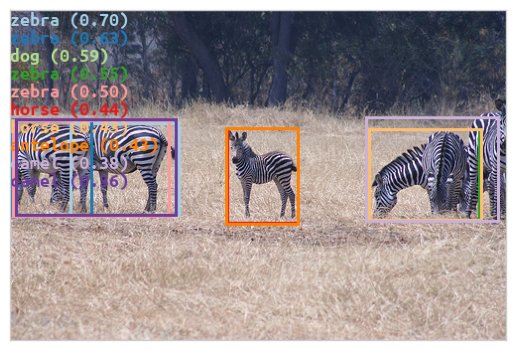

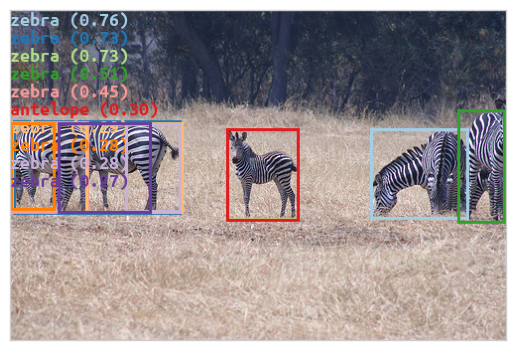

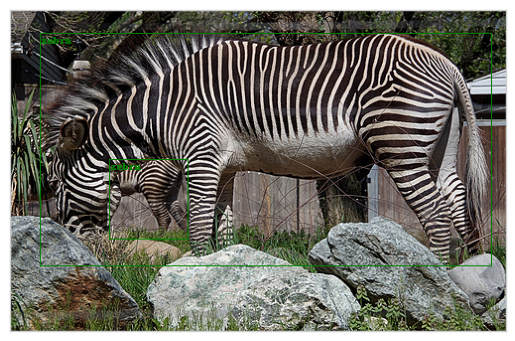

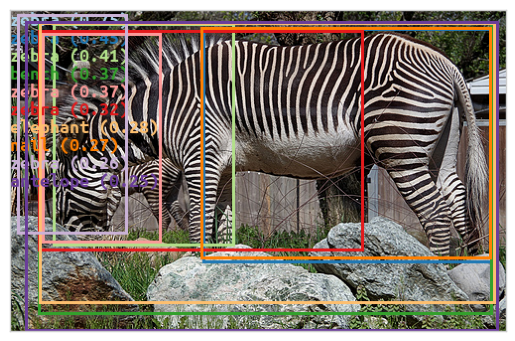

...

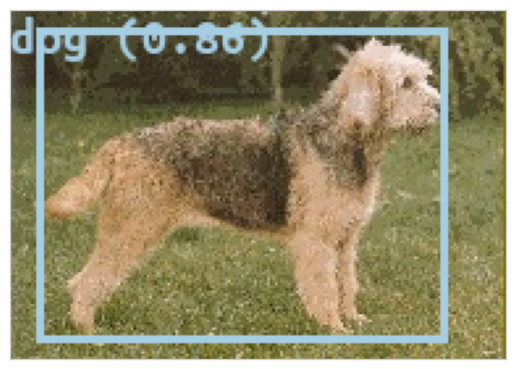

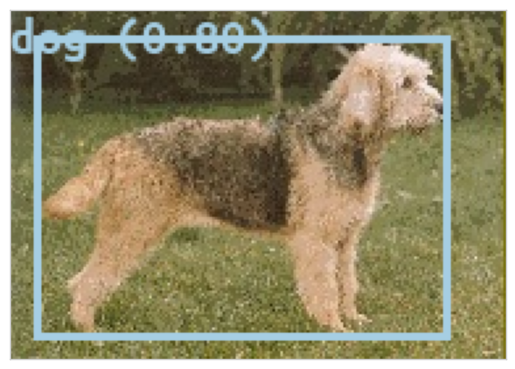

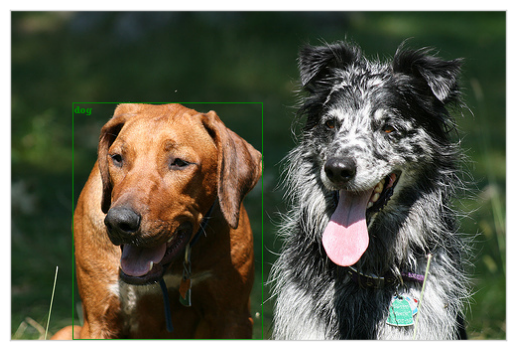

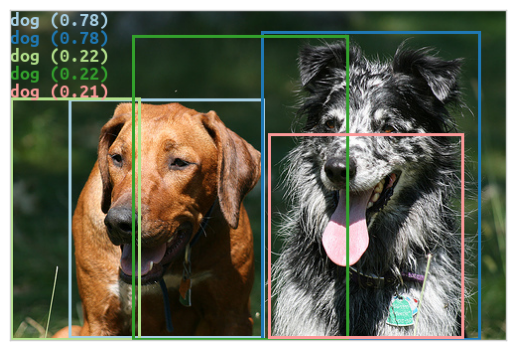

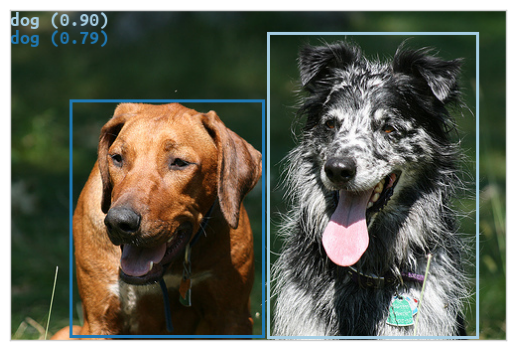

In [308]:
for idx in WANT:
    idx = have_imgs[idx]
    print('ground truth')
    show_with_bboxes(val_ds[idx])
    for name, results in NAMED:
        print('inference at ', name)
        #show_with_bboxes_inference(idx, val_ds, results)
        show_default(idx, val_ds, results)
        
        

In [1]:
# https://laszukdawid.com/blog/2021/01/26/parsing-tensorboard-data-locally/
def convert_tb_data(root_dir, sort_by=None):
    """Convert local TensorBoard data into Pandas DataFrame.
    
    Function takes the root directory path and recursively parses
    all events data.    
    If the `sort_by` value is provided then it will use that column
    to sort values; typically `wall_time` or `step`.
    
    *Note* that the whole data is converted into a DataFrame.
    Depending on the data size this might take a while. If it takes
    too long then narrow it to some sub-directories.
    
    Paramters:
        root_dir: (str) path to root dir with tensorboard data.
        sort_by: (optional str) column name to sort by.
    
    Returns:
        pandas.DataFrame with [wall_time, name, step, value] columns.
    
    """
    import os
    import pandas as pd
    from tensorflow.python.summary.summary_iterator import summary_iterator

    def convert_tfevent(filepath):
        return pd.DataFrame([
            parse_tfevent(e) for e in summary_iterator(filepath) if len(e.summary.value)
        ])

    def parse_tfevent(tfevent):
        return dict(
            wall_time=tfevent.wall_time,
            name=tfevent.summary.value[0].tag,
            step=tfevent.step,
            value=float(tfevent.summary.value[0].simple_value),
        )
    
    columns_order = ['wall_time', 'name', 'step', 'value']
    
    out = []
    for (root, _, filenames) in os.walk(root_dir):
        for filename in filenames:
            if "events.out.tfevents" not in filename:
                continue
            file_full_path = os.path.join(root, filename)
            out.append(convert_tfevent(file_full_path))

    # Concatenate (and sort) all partial individual dataframes
    all_df = pd.concat(out)[columns_order]
    if sort_by is not None:
        all_df = all_df.sort_values(sort_by)
        
    return all_df.reset_index(drop=True)

In [19]:
BAD_RUN_DIR = 'data/weights/run3_extra_burnin_1_out_collapse_v4'

bad_run_df = convert_tb_data(BAD_RUN_DIR)

In [22]:
bad_run_df

,wall_time,name,step,value
0,1.669773e+09,data_time,100019,0.114514
1,1.669773e+09,total_loss,100019,2.324487
2,1.669773e+09,ema_rate_1000x,100019,999.900024
3,1.669773e+09,loss_fcos_cls,100019,0.364685
4,1.669773e+09,loss_fcos_loc,100019,0.208377
...,...,...,...,...
95194,1.669742e+09,loss_fcos_loc,108029,0.198022
95195,1.669742e+09,loss_fcos_ctr,108029,0.582443
95196,1.669742e+09,lr,108029,0.010000
95197,1.669742e+09,time,108029,0.740385


In [20]:
bad_run_cols = bad_run_df['name'].unique()
bad_run_cols

array(['data_time', 'total_loss', 'ema_rate_1000x', 'loss_fcos_cls',
       'loss_fcos_loc', 'loss_fcos_ctr', 'loss_fcos_cls_pseudo',
       'loss_fcos_ctr_pseudo', 'teacher_better_student_pseudo',
       'loss_fcos_loc_pseudo', 'lr', 'time', 'eta_seconds',
       'bbox_student/AP', 'bbox_student/AP50', 'bbox_student/AP75',
       'bbox_student/APs', 'bbox_student/APm', 'bbox_student/APl',
       'bbox_student/AP-cup or mug', 'bbox_student/AP-bird',
       'bbox_student/AP-hat with a wide brim', 'bbox_student/AP-person',
       'bbox_student/AP-dog', 'bbox_student/AP-lizard',
       'bbox_student/AP-sheep', 'bbox_student/AP-wine bottle',
       'bbox_student/AP-bowl', 'bbox_student/AP-airplane',
       'bbox_student/AP-domestic cat', 'bbox_student/AP-car',
       'bbox_student/AP-porcupine', 'bbox_student/AP-bear',
       'bbox_student/AP-tape player', 'bbox_student/AP-ray',
       'bbox_student/AP-laptop', 'bbox_student/AP-zebra',
       'bbox_student/AP-computer keyboard', 'bbox_stud

In [45]:
def remove_older_runs_lower(df):
    latest = df.groupby(by='step', sort=True).agg({
        'step': 'max',
        'wall_time': 'idxmax',
        'value': 'max'
    })
    latest['wall_time'] = df.loc[latest['wall_time'], 'wall_time'].values
    return latest

In [40]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


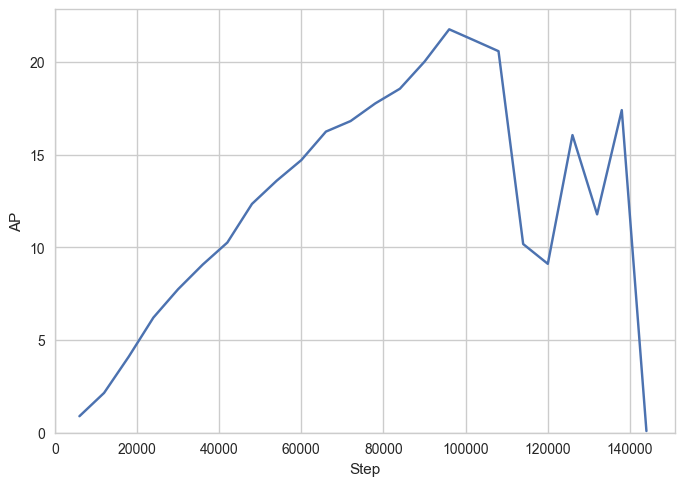

In [65]:
ap = remove_older_runs_lower(bad_run_df[bad_run_df['name'] == 'bbox_student/AP'].dropna())
plt.style.use('seaborn-v0_8-whitegrid')

plt.plot(ap['step'], ap['value'])
plt.xlabel('Step')
plt.ylabel('AP')
plt.ylim(bottom=0)
plt.xlim(left=0)
#plt.title('AP vs step')
plt.show()

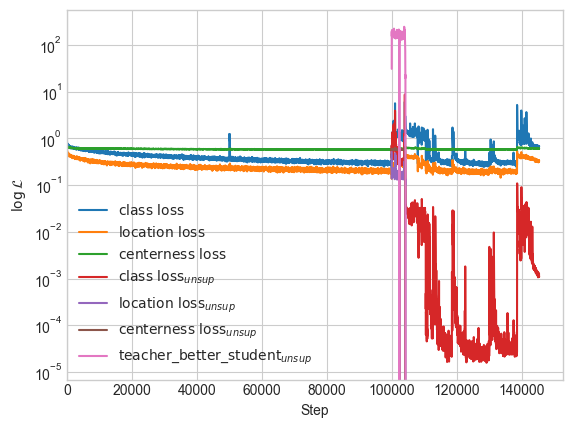

In [120]:
import matplotlib
COLS = [('loss_fcos_cls', 'class loss'), ('loss_fcos_loc', 'location loss'), 
        ('loss_fcos_ctr', 'centerness loss')]
PSEUDO_ONLY = [('teacher_better_student_pseudo', 'teacher_better_student')]

WANT_COLS = COLS + [(f'{col}_pseudo', pretty) for col, pretty in COLS] + PSEUDO_ONLY
#matplotlib.rcParams['text.usetex'] = False
#matplotlib.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}'] #
#plt.rcParams.update(params)
matplotlib.pyplot.rcdefaults()
plt.style.use('seaborn-v0_8-whitegrid')



for col, pretty in WANT_COLS:
    to_plot = remove_older_runs_lower(bad_run_df[bad_run_df['name'] == col].dropna())
    if 'pseudo' in col:
        to_plot = to_plot[to_plot['step'] > 70000]
   # to_plot['value'] = to_plot['value'].clip(lower=1)
    #label = '$\\textnormal{' + pretty + ('}_{unsup}$' if 'pseudo' in col else '}$')
    #label = '{' + pretty + ('}_{unsup}' if 'pseudo' in col else '}')
    label_base = r'$\mathrm{' + pretty.replace(' ', r'\ ').replace('_', r'\_') + '}'
    label = label_base + ('_{unsup}$' if 'pseudo' in col else '$')
    plt.plot(to_plot['step'], to_plot['value'], label=label)

         
plt.xlabel('Step')
plt.ylabel('$\log \mathcal{L}$')
#plt.ylim(bottom=0)
plt.xlim(left=0)
plt.legend()
#plt.title('AP vs step')
#pyplot.loglog()
plt.yscale('log', nonpositive='clip')
#plt.yscale('symlog')
plt.show()


In [142]:
FINAL_RUN_DIR = 'data/weights/checkpoint_model_low_lr_3_no_mismatch_low_unsup_13'

final_run_df = convert_tb_data(FINAL_RUN_DIR)

In [192]:
all_cols = final_run_df['name'].unique()

student_ap_cols = [col for col in all_cols if col.startswith('bbox_student/AP-')]
student_ap_cols.sort()
teacher_ap_cols = [col for col in all_cols if col.startswith('bbox/AP-')]
teacher_ap_cols.sort()

def extract_col(df, col):
    return remove_older_runs_lower(df[df['name'] == col])

def extract_row(df, step):
    return df[df['step'] == step].iloc[0]['value']

LAST_SUP_STEP = 173999
LAST_STEP = 437999
    
final_unsupervised_ap = {
    col.split('-')[-1]: extract_row(extract_col(final_run_df, col), LAST_STEP)
    for col in teacher_ap_cols
}

final_supervised_ap = {
    col.split('-')[-1]: extract_row(extract_col(final_run_df, col), LAST_SUP_STEP)
    for col in student_ap_cols
}

In [386]:
ap_s = extract_row(extract_col(final_run_df, 'bbox/APs'), LAST_STEP)
ap_m = extract_row(extract_col(final_run_df, 'bbox/APm'), LAST_STEP)
ap_l = extract_row(extract_col(final_run_df, 'bbox/APl'), LAST_STEP)

print([ap_s, ap_m, ap_l])

[7.161243915557861, 20.79446029663086, 47.56300354003906]


In [242]:
unsup_ap_gain = {
    category: final_unsupervised_ap[category] -  final_supervised_ap[category]
    for category in (set(final_supervised_ap.keys()).union(set(final_unsupervised_ap.keys())))
}

unsup_ap_gain_pct = {
    category: final_unsupervised_ap[category] / final_supervised_ap[category] - 1
    for category in (set(final_supervised_ap.keys()).union(set(final_unsupervised_ap.keys())))
}

In [152]:
import json

val_annotations = json.load(open('data/annotations/annotations_validation.json'))

In [189]:
import collections

category_id_count = collections.Counter([
    ann['category_id'] for ann in val_annotations['annotations']
])

index_to_class = load_data.load_inverted_class_index()

name_to_count = {
    index_to_class[index]: count for index, count in category_id_count.items()
}


In [361]:
total_count = sum(name_to_count.values())

name_to_frac = {
    name: count / total_count for name, count in name_to_count.items()
}
print(list(sorted(name_to_frac.items(), key=lambda x: -x[-1])))
print(name_to_frac['microphone'])

[('dog', 0.20414008120649652), ('person', 0.11223897911832946), ('bird', 0.10187064965197216), ('car', 0.027842227378190254), ('watercraft', 0.024869489559164733), ('monkey', 0.024760730858468676), ('snake', 0.024071925754060326), ('chair', 0.02095417633410673), ('table', 0.017981438515081206), ('lizard', 0.015226218097447796), ('butterfly', 0.010948375870069606), ('domestic cat', 0.010513341067285383), ('bus', 0.009316995359628771), ('helmet', 0.008591937354988399), ('motorcycle', 0.008120649651972157), ('cart', 0.007649361948955917), ('turtle', 0.007468097447795824), ('bear', 0.007431844547563805), ('bowl', 0.0073230858468677495), ('cup or mug', 0.007250580046403712), ('fox', 0.00706931554524362), ('ray', 0.0069605568445475635), ('lamp', 0.006888051044083527), ('guitar', 0.006851798143851508), ('drum', 0.006344257540603249), ('microphone', 0.00630800464037123), ('antelope', 0.006271751740139211), ('horse', 0.006199245939675174), ('banana', 0.006126740139211137), ('tv or monitor', 0.0

In [388]:
total_count = sum(name_to_count.values())
count_by_names = [name_to_count[name]  for name in names]
pct_gain_by_names = [(unsup_ap_gain_pct[name], name) for name in names]

gain, name = next(reversed(sorted(pct_gain_by_names)))
gain, name

(5.874233394559438, 'microphone')

In [392]:
total_count = sum(name_to_count.values())
count_by_names = [name_to_count[name]  for name in names]
all_gain_by_names = [(unsup_ap_gain_pct[name] * 100, name_to_count[name], name) for name in names]

print(all_gain_by_names)

[(35.97934900918362, 159, 'elephant'), (43.60607279729414, 145, 'apple'), (51.317484764458364, 192, 'ray'), (34.87924910608564, 3096, 'person'), (28.59020027798389, 160, 'hat with a wide brim'), (36.52517382485829, 683, 'monkey'), (56.72787890286581, 119, 'dragonfly'), (40.91787537113074, 61, 'red panda'), (34.238588618812486, 68, 'salt or pepper shaker'), (33.62709402279398, 127, 'sofa'), (25.31502656414528, 151, 'orange'), (41.157699406295166, 206, 'turtle'), (42.1854453752954, 153, 'bathing cap'), (116.51701990882431, 129, 'wine bottle'), (56.90512151482401, 88, 'skunk'), (319.8216270229311, 104, 'ski'), (134.5934908304091, 104, 'dumbbell'), (37.2613593738365, 664, 'snake'), (113.80804849766109, 92, 'fig'), (41.521628469065, 81, 'tape player'), (32.96706960356133, 85, 'beaker'), (35.45786481419957, 195, 'fox'), (14.071023093614388, 165, 'tv or monitor'), (35.53668605103426, 85, 'ladybug'), (47.25991460976346, 84, 'laptop'), (124.34427469055164, 67, 'cucumber'), (124.94217574595478, 

100
100


Text(0.5, 0, 'Class annotation instances')

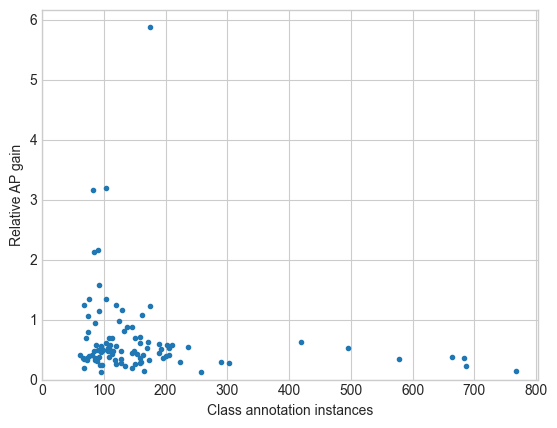

In [371]:
import numpy as np

matplotlib.pyplot.rcdefaults()
names = list(unsup_ap_gain.keys())
plt.style.use('seaborn-v0_8-whitegrid')


total_count = sum(name_to_count.values())
count_by_names = [name_to_count[name]  for name in names]
pct_gain_by_names = [unsup_ap_gain_pct[name] for name in names]

count = np.array(count_by_names, dtype=float)
pct = np.array(pct_gain_by_names, dtype=float)

count, pct = zip(*sorted(zip(count, pct)))
print(len(count))
print(len(pct))
count = count[:-3]
pct = pct[:-3]

plt.scatter(x=count, y=pct, marker='.')




trend = np.polyfit(count, pct, 1)
p = np.poly1d(trend)


#plt.plot(count, p(count), 'r--', label='trend line')
plt.ylabel(r'Relative AP gain')
#plt.title(r'$\frac{\mathrm{AP}_{sup}}{\mathrm{AP}_{unsup}} - 1$ vs instance count')
plt.xlim(left=0)
plt.ylim(bottom=0)
plt.xlabel('Class annotation instances')
#plt.legend()
#plt.xscale('log')
#plt.yscale('log')

100
100


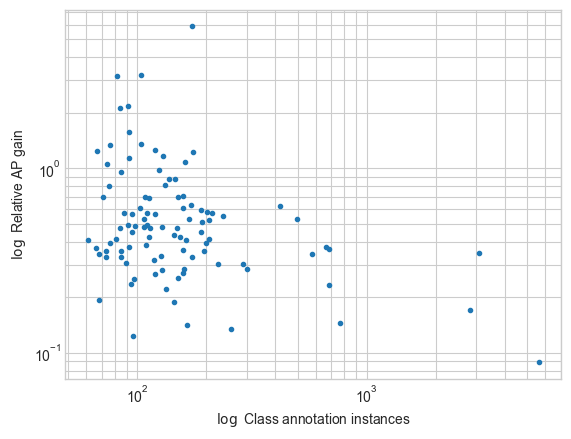

In [378]:
import numpy as np

matplotlib.pyplot.rcdefaults()
names = list(unsup_ap_gain.keys())
plt.style.use('seaborn-v0_8-whitegrid')


total_count = sum(name_to_count.values())
count_by_names = [name_to_count[name]  for name in names]
pct_gain_by_names = [unsup_ap_gain_pct[name] for name in names]

count = np.array(count_by_names, dtype=float)
pct = np.array(pct_gain_by_names, dtype=float)

count, pct = zip(*sorted(zip(count, pct)))
print(len(count))
print(len(pct))
count = count
pct = pct

plt.scatter(x=count, y=pct, marker='.')


trend = np.polyfit(count, pct, 1)
p = np.poly1d(trend)


#plt.plot(count, p(count), 'r--', label='trend line')
plt.ylabel(r'$\log$ Relative AP gain')
#plt.title(r'$\frac{\mathrm{AP}_{sup}}{\mathrm{AP}_{unsup}} - 1$ vs instance count')
#plt.xlim(left=0)
#plt.ylim(bottom=0)
plt.xlabel('$\log$ Class annotation instances')
#plt.legend()
plt.xscale('log')
plt.yscale('log')
plt.grid(True, which='both')